**NOTE:** if you're on the CoRE machine, make sure to activate the appropriate `env` before running `jupyter notebook`.

```
$ source activate core-dev
$ jupyter notebook
```

In [1]:
import glob

import numpy as np
import pandas as pd

from coremdlr.coresegmenter import CoreSegmenter
from coremdlr.utils.viz_utils import show_images

Using TensorFlow backend.


In [2]:
model_dir = '/home/administrator/Dropbox/core_data/saved_models/mrcnn/latest'
weights_path = model_dir + '/core20180801T1515/mask_rcnn_core_0066.h5'
#config = CoreConfig()

segmenter = CoreSegmenter(model_dir, weights_path) #, model_config=config)

building model
loading weights
Re-starting from epoch 66


In [3]:
test_dir = '/home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/'
depth_df = pd.read_csv(test_dir+'204-19-6_depths.csv')
depth_df

,Unnamed: 0,filepaths,top,bottom
0,S00111577.jpeg,S00111577.jpeg,2208,2210
1,S00111578.jpeg,S00111578.jpeg,2210,2212
2,S00111579.jpeg,S00111579.jpeg,2212,2214
3,S00111580.jpeg,S00111580.jpeg,2214,2216
4,S00111581.jpeg,S00111581.jpeg,2216,2218
5,S00111582.jpeg,S00111582.jpeg,2218,2220
6,S00111583.jpeg,S00111583.jpeg,2220,2221


In [4]:
tops = depth_df.top.values.astype(float)
bottoms = depth_df.bottom.values.astype(float)

test_files = sorted(glob.glob(test_dir+'*.jpeg'))

# segment each of the test files with (top, bottom) depth_range
cols = [segmenter.segment(f, [t, b]) for f, t, b in zip(test_files, tops, bottoms)]

Reading file: /home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/S00111577.jpeg


/home/administrator/anaconda3/envs/core-dev/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


[2208.0, 2209.0] [2209.0, 2210.0] 0.0
Reading file: /home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/S00111578.jpeg
[2210.0, 2211.0] [2211.0, 2212.0] 0.0
Reading file: /home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/S00111579.jpeg
[2212.0, 2213.0] [2213.0, 2214.0] 0.0
Reading file: /home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/S00111580.jpeg
[2214.0, 2215.0] [2215.0, 2216.0] 0.0
Reading file: /home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/S00111581.jpeg
[2216.0, 2217.0] [2217.0, 2218.0] 0.0
Reading file: /home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/S00111582.jpeg
[2218.0, 2219.0] [2219.0, 2220.0] 0.0
Reading file: /home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/converted/S

In [5]:
from functools import reduce
from operator import add

# stack all the image columns into single core column
core_col = reduce(add, cols)
core_col.img.dtype

dtype('uint8')

In [6]:
# trim the bottom
#good = np.logical_and(core_col.x_depth > 2210.0, core_col.x_depth < 2220)

#core_col.x_depth = core_col.x_depth[good]
#core_col.img = core_col.img[good]

In [7]:
core_col.depth_range, core_col.x_depth.shape, core_col.img.shape

([2208.0, 2221.199865749287], (78689,), (78689, 680, 3))

## Make image + `striplog` plot

Header section Parameter regexp=~P was not found.


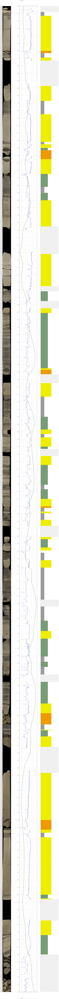

In [18]:
import matplotlib.pyplot as plt

labels_file='/home/administrator/Dropbox/core_data/204-19-6_picks.csv'
logs_file='/home/administrator/Dropbox/core_data/well_core_data/wos_data/schiehallion-complex/204-19-6/204_19-6_DATACO_JWDL_QC.las'

fig_height = 400
aspect = core_col.img.shape[1] / core_col.img.shape[0]

fig, ax = plt.subplots(ncols=3, figsize=(7*aspect*fig_height,fig_height))

core_col.plot_image(ax=ax[0])
core_col.plot_logs(ax[1], las_file=logs_file)
core_col.plot_strip(ax[2], picks_file=labels_file)

# to save instead (or after), call:
fig.savefig('/home/administrator/Dropbox/core_data/full_fig_with_pseudoGR.png')
#plt.show()